In [1]:
# pip install mlflow boto3 awscli optuna imbalanced-learn lightgbm
#! pip install plotly

In [2]:
import mlflow
# step 1 : Set up the mlflow tracking server 
mlflow.set_tracking_uri("http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/")

In [3]:
mlflow.set_experiment("EXP-7 LightGBM(best_model)HPTuning-5000 max featurs")

2025/11/22 20:08:35 INFO mlflow.tracking.fluent: Experiment with name 'EXP-7 LightGBM(best_model)HPTuning-5000 max featurs' does not exist. Creating a new experiment.


<Experiment: artifact_location='s3://youtube-recommender-exp-bucket/7', creation_time=1763822314559, experiment_id='7', last_update_time=1763822314559, lifecycle_stage='active', name='EXP-7 LightGBM(best_model)HPTuning-5000 max featurs', tags={}>

In [4]:
import optuna
import mlflow
import mlflow.sklearn
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score,classification_report,f1_score
from sklearn.feature_extraction.text import CountVectorizer
from lightgbm import LGBMClassifier
from imblearn.under_sampling import RandomUnderSampler
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np
from optuna.visualization import matplotlib as vis

c:\Users\mukti\Desktop\youtube_sentiment_analysis\youtube_env\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [5]:
df = pd.read_csv(r'C:\Users\mukti\Desktop\youtube_sentiment_analysis\youtube_preprocessing.csv').dropna(subset=['clean_comment'])
df.shape

(36662, 2)

In [6]:
# Step 1: Remap the class labels from [-1, 0, 1] to [2, 0, 1]
df['category'] = df['category'].map({-1: 2, 0: 0, 1: 1})

# Step 2: Remove rows where the target labels (category) are NaN
df = df.dropna(subset=['category'])

#step 3: BOW setup with train test split
ngram_range = (1,3) 
max_features = 5000 

X_train,X_test,y_train,y_test = train_test_split(df['clean_comment'],df['category'],test_size=0.2,random_state=42,stratify=df['category'])

vectorizer = CountVectorizer(ngram_range=ngram_range,max_features=max_features)
X_train_vec= vectorizer.fit_transform(X_train).astype(np.float32)
X_test_vec = vectorizer.transform(X_test).astype(np.float32)

# use undersampler to handle Imbalanced data
rus = RandomUnderSampler(random_state=42)
X_train_vec,y_train = rus.fit_resample(X_train_vec,y_train)
X_train_vec = X_train_vec.astype(np.float32)

#Function to log results in MLflow
def log_mlflow_trial(model_name,params,metrics,trial_number):
    # FIXED: Separate MLflow run per trial (avoid retraining full data)
        # Log model type and trial number
    with mlflow.start_run(run_name=f"Trial_{trial_number}_{model_name}_BOW"):
        mlflow.set_tag("experiment_type", "algorithm_comparison")
        mlflow.log_params(params)
        mlflow.log_metric("val_accuracy", metrics)

def log_mlflow_best(model_name, model, X_train, X_test, y_train, y_test, params):
    # FIXED: Log best model trained on full data separately
     with mlflow.start_run(run_name=f"Best_{model_name}_BOW"):
        mlflow.set_tag("experiment_type", "algorithm_comparison")
        mlflow.log_params(params)
        y_pred = model.predict(X_test)
        test_acc = accuracy_score(y_test, y_pred)
        mlflow.log_metric("test_accuracy", test_acc)    

        # Log classification report
        classification_rep = classification_report(y_test, y_pred, output_dict=True)
        for label, metrics in classification_rep.items():
            if isinstance(metrics, dict):
                for metric, value in metrics.items():
                    mlflow.log_metric(f"{label}_{metric}", value)

        # Log the model
        mlflow.sklearn.log_model(model, f"{model_name}_model")

    

[I 2025-11-22 20:08:41,629] A new study created in memory with name: no-name-2cdfb013-6fdd-43c2-abf8-e0df93ac1c4c


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.010100 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3283
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 719
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

c:\Users\mukti\Desktop\youtube_sentiment_analysis\youtube_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_0_LightGBM_BOW at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/7/runs/1ded4bcd321d41d983a17db601088ff8
🧪 View experiment at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/7


[I 2025-11-22 20:08:47,211] Trial 0 finished with value: 0.7506946198534984 and parameters: {'n_estimators': 408, 'learning_rate': 0.05743851962173968, 'max_depth': 13, 'num_leaves': 74, 'min_child_samples': 65, 'colsample_bytree': 0.8359732470081245, 'subsample': 0.9096871010234477, 'reg_alpha': 0.0005996204534654098, 'reg_lambda': 0.2059101234162414}. Best is trial 0 with value: 0.7506946198534984.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.007340 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2777
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 586
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No

c:\Users\mukti\Desktop\youtube_sentiment_analysis\youtube_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_1_LightGBM_BOW at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/7/runs/7adb2c61c629448f936067f680fe9f28
🧪 View experiment at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/7


[I 2025-11-22 20:08:50,999] Trial 1 finished with value: 0.6297044708259661 and parameters: {'n_estimators': 482, 'learning_rate': 0.0007670758357718565, 'max_depth': 7, 'num_leaves': 76, 'min_child_samples': 80, 'colsample_bytree': 0.6452427213455809, 'subsample': 0.6254185145410739, 'reg_alpha': 2.566368772087314, 'reg_lambda': 0.11485765545014644}. Best is trial 0 with value: 0.7506946198534984.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.053696 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 11406
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 3446
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] 

c:\Users\mukti\Desktop\youtube_sentiment_analysis\youtube_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_2_LightGBM_BOW at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/7/runs/f002420825fc4d8f9c9e750f1652569e
🧪 View experiment at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/7


[I 2025-11-22 20:09:15,138] Trial 2 finished with value: 0.7628188936600152 and parameters: {'n_estimators': 999, 'learning_rate': 0.005541623571652404, 'max_depth': 13, 'num_leaves': 93, 'min_child_samples': 14, 'colsample_bytree': 0.5376271546452929, 'subsample': 0.5175915256563259, 'reg_alpha': 0.6481907110535969, 'reg_lambda': 0.0010737377761742234}. Best is trial 2 with value: 0.7628188936600152.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.010568 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3817
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 864
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

c:\Users\mukti\Desktop\youtube_sentiment_analysis\youtube_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_3_LightGBM_BOW at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/7/runs/2abc162e2fd447e0936dcfb7cfedc76c
🧪 View experiment at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/7


[I 2025-11-22 20:09:19,360] Trial 3 finished with value: 0.6610255114928012 and parameters: {'n_estimators': 885, 'learning_rate': 0.006437047305187074, 'max_depth': 3, 'num_leaves': 58, 'min_child_samples': 56, 'colsample_bytree': 0.7236370754263768, 'subsample': 0.523786970103928, 'reg_alpha': 0.520419446491445, 'reg_lambda': 0.028374044943594526}. Best is trial 2 with value: 0.7628188936600152.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.037543 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 6696
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 1745
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further s

c:\Users\mukti\Desktop\youtube_sentiment_analysis\youtube_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_4_LightGBM_BOW at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/7/runs/bd21bc11a53c466792c9359a52a36988
🧪 View experiment at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/7


[I 2025-11-22 20:09:22,344] Trial 4 finished with value: 0.7572619348320283 and parameters: {'n_estimators': 155, 'learning_rate': 0.09298634953184826, 'max_depth': 6, 'num_leaves': 141, 'min_child_samples': 28, 'colsample_bytree': 0.7995259388708262, 'subsample': 0.9157199726971241, 'reg_alpha': 4.298507127818285, 'reg_lambda': 0.0005638394744282657}. Best is trial 2 with value: 0.7628188936600152.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.016388 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 5571
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 1379
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further s

c:\Users\mukti\Desktop\youtube_sentiment_analysis\youtube_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_5_LightGBM_BOW at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/7/runs/3b00d3cd174f488994a56f24fc0135d6
🧪 View experiment at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/7


[I 2025-11-22 20:09:32,329] Trial 5 finished with value: 0.6365243748421319 and parameters: {'n_estimators': 847, 'learning_rate': 0.0004570760760623188, 'max_depth': 7, 'num_leaves': 64, 'min_child_samples': 35, 'colsample_bytree': 0.5251636528850998, 'subsample': 0.749935442165866, 'reg_alpha': 0.00025344917658567706, 'reg_lambda': 1.8093853403958728}. Best is trial 2 with value: 0.7628188936600152.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.009246 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3114
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 673
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

c:\Users\mukti\Desktop\youtube_sentiment_analysis\youtube_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_6_LightGBM_BOW at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/7/runs/b6e2cd4b317c421e8959a164a386684d
🧪 View experiment at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/7


[I 2025-11-22 20:09:36,913] Trial 6 finished with value: 0.7481687294771406 and parameters: {'n_estimators': 540, 'learning_rate': 0.08263571884358407, 'max_depth': 8, 'num_leaves': 143, 'min_child_samples': 69, 'colsample_bytree': 0.6086176681015677, 'subsample': 0.8970147633989685, 'reg_alpha': 0.3624909289801146, 'reg_lambda': 1.414245200795737}. Best is trial 2 with value: 0.7628188936600152.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.009944 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2525
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 523
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No

c:\Users\mukti\Desktop\youtube_sentiment_analysis\youtube_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_7_LightGBM_BOW at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/7/runs/c4cbf5e9b00244aab6e23b0e7d4cf69f
🧪 View experiment at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/7


[I 2025-11-22 20:09:42,498] Trial 7 finished with value: 0.6127810053043697 and parameters: {'n_estimators': 599, 'learning_rate': 0.0003586370681798169, 'max_depth': 5, 'num_leaves': 147, 'min_child_samples': 88, 'colsample_bytree': 0.5720963264345424, 'subsample': 0.5368604974898528, 'reg_alpha': 0.001770274838139307, 'reg_lambda': 0.08320041958070772}. Best is trial 2 with value: 0.7628188936600152.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.008669 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2777
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 586
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

c:\Users\mukti\Desktop\youtube_sentiment_analysis\youtube_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_8_LightGBM_BOW at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/7/runs/906039712cbe4cecaf2eed647807a668
🧪 View experiment at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/7


[I 2025-11-22 20:09:47,696] Trial 8 finished with value: 0.6451124021217479 and parameters: {'n_estimators': 363, 'learning_rate': 0.0005296389448973104, 'max_depth': 12, 'num_leaves': 27, 'min_child_samples': 80, 'colsample_bytree': 0.7446990188104904, 'subsample': 0.5358915923045557, 'reg_alpha': 1.7448271261788757, 'reg_lambda': 0.00020247617416780303}. Best is trial 2 with value: 0.7628188936600152.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.025638 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3594
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 802
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No

c:\Users\mukti\Desktop\youtube_sentiment_analysis\youtube_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_9_LightGBM_BOW at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/7/runs/967c287c08714e1a8b1c5a86554abf94
🧪 View experiment at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/7


[I 2025-11-22 20:09:53,842] Trial 9 finished with value: 0.7140692093963122 and parameters: {'n_estimators': 609, 'learning_rate': 0.004636151214563118, 'max_depth': 13, 'num_leaves': 57, 'min_child_samples': 60, 'colsample_bytree': 0.8546284444132461, 'subsample': 0.8210927621267637, 'reg_alpha': 0.813891813428446, 'reg_lambda': 0.026014070761237778}. Best is trial 2 with value: 0.7628188936600152.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.156854 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 13607
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 4298
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further 

c:\Users\mukti\Desktop\youtube_sentiment_analysis\youtube_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_10_LightGBM_BOW at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/7/runs/77263c41224d4706bdcb72f6e102a3ce
🧪 View experiment at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/7


[I 2025-11-22 20:10:32,821] Trial 10 finished with value: 0.6413235665572115 and parameters: {'n_estimators': 952, 'learning_rate': 0.00010101658037828648, 'max_depth': 15, 'num_leaves': 106, 'min_child_samples': 10, 'colsample_bytree': 0.9778559953073003, 'subsample': 0.6802283638121991, 'reg_alpha': 0.027200058245530404, 'reg_lambda': 0.0024790933029811817}. Best is trial 2 with value: 0.7628188936600152.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.045257 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 9439
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 2712
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further s

c:\Users\mukti\Desktop\youtube_sentiment_analysis\youtube_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_11_LightGBM_BOW at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/7/runs/0e32251d2fb34537b15ee0f82c0d207d
🧪 View experiment at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/7


[I 2025-11-22 20:10:37,159] Trial 11 finished with value: 0.6832533468047487 and parameters: {'n_estimators': 173, 'learning_rate': 0.017894298808970015, 'max_depth': 10, 'num_leaves': 111, 'min_child_samples': 18, 'colsample_bytree': 0.86577088127133, 'subsample': 0.9847984431968819, 'reg_alpha': 8.486233897378652, 'reg_lambda': 0.00010591595529708889}. Best is trial 2 with value: 0.7628188936600152.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.028093 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 5448
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 1342
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further s

c:\Users\mukti\Desktop\youtube_sentiment_analysis\youtube_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_12_LightGBM_BOW at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/7/runs/e4fd04ad9c394874bd92395c1b84dc5f
🧪 View experiment at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/7


[I 2025-11-22 20:10:41,116] Trial 12 finished with value: 0.6835059358423844 and parameters: {'n_estimators': 106, 'learning_rate': 0.018975341270207603, 'max_depth': 10, 'num_leaves': 116, 'min_child_samples': 36, 'colsample_bytree': 0.6937476089521414, 'subsample': 0.7590218666269043, 'reg_alpha': 0.06128346266470886, 'reg_lambda': 0.0009768287650452027}. Best is trial 2 with value: 0.7628188936600152.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.031360 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 5984
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 1510
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further s

c:\Users\mukti\Desktop\youtube_sentiment_analysis\youtube_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_13_LightGBM_BOW at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/7/runs/666882e483d14c569f36e28fec2381b4
🧪 View experiment at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/7


[I 2025-11-22 20:10:48,025] Trial 13 finished with value: 0.6289467037130588 and parameters: {'n_estimators': 740, 'learning_rate': 0.0018801223949737958, 'max_depth': 5, 'num_leaves': 130, 'min_child_samples': 32, 'colsample_bytree': 0.7939280308003241, 'subsample': 0.9958001547724109, 'reg_alpha': 0.06709730423188759, 'reg_lambda': 0.0030314033433448393}. Best is trial 2 with value: 0.7628188936600152.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.036130 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 8120
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 2242
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further s

c:\Users\mukti\Desktop\youtube_sentiment_analysis\youtube_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_14_LightGBM_BOW at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/7/runs/e8acb3db935a421e8f6d8241fd1358e2
🧪 View experiment at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/7


[I 2025-11-22 20:10:53,066] Trial 14 finished with value: 0.7181106339984845 and parameters: {'n_estimators': 237, 'learning_rate': 0.019612521728194266, 'max_depth': 15, 'num_leaves': 92, 'min_child_samples': 22, 'colsample_bytree': 0.948799031986738, 'subsample': 0.6095394454090095, 'reg_alpha': 9.632451399485019, 'reg_lambda': 0.000490763661396292}. Best is trial 2 with value: 0.7628188936600152.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.015034 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4787
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 1144
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] N

c:\Users\mukti\Desktop\youtube_sentiment_analysis\youtube_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_15_LightGBM_BOW at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/7/runs/3e2dbcd5857a4544bf13598dea4c7b89
🧪 View experiment at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/7


[I 2025-11-22 20:11:01,860] Trial 15 finished with value: 0.67542308663804 and parameters: {'n_estimators': 731, 'learning_rate': 0.001997655421224609, 'max_depth': 11, 'num_leaves': 32, 'min_child_samples': 43, 'colsample_bytree': 0.6789298797574362, 'subsample': 0.8264694113420196, 'reg_alpha': 0.006478736037230555, 'reg_lambda': 0.003480599827975822}. Best is trial 2 with value: 0.7628188936600152.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.039453 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 8120
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 2242
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further s

c:\Users\mukti\Desktop\youtube_sentiment_analysis\youtube_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_16_LightGBM_BOW at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/7/runs/b08262b9a7234c3c872f523f2e3948c9
🧪 View experiment at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/7


[I 2025-11-22 20:11:15,659] Trial 16 finished with value: 0.8123263450366254 and parameters: {'n_estimators': 998, 'learning_rate': 0.04119700978682985, 'max_depth': 5, 'num_leaves': 128, 'min_child_samples': 22, 'colsample_bytree': 0.5181542050311201, 'subsample': 0.6931415090009985, 'reg_alpha': 0.1887452179457516, 'reg_lambda': 0.010743294454636293}. Best is trial 16 with value: 0.8123263450366254.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.045635 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 12560
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 3893
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further 

c:\Users\mukti\Desktop\youtube_sentiment_analysis\youtube_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_17_LightGBM_BOW at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/7/runs/b04ac641418d40eb99fa88d3512315a5
🧪 View experiment at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/7


[I 2025-11-22 20:11:35,273] Trial 17 finished with value: 0.7107855519070473 and parameters: {'n_estimators': 941, 'learning_rate': 0.008473090771031162, 'max_depth': 4, 'num_leaves': 90, 'min_child_samples': 12, 'colsample_bytree': 0.5012723941198547, 'subsample': 0.6159116856302802, 'reg_alpha': 0.1419434844412333, 'reg_lambda': 0.009991124849949433}. Best is trial 16 with value: 0.8123263450366254.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.015795 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4365
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 1020
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further s

c:\Users\mukti\Desktop\youtube_sentiment_analysis\youtube_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_18_LightGBM_BOW at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/7/runs/956e30676c2f4c3eb060aceb2d87b456
🧪 View experiment at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/7


[I 2025-11-22 20:11:44,325] Trial 18 finished with value: 0.7772164688052539 and parameters: {'n_estimators': 994, 'learning_rate': 0.03904717940417589, 'max_depth': 9, 'num_leaves': 123, 'min_child_samples': 48, 'colsample_bytree': 0.5616792078842512, 'subsample': 0.6790012900189668, 'reg_alpha': 0.010259253218555975, 'reg_lambda': 0.010230515587171815}. Best is trial 16 with value: 0.8123263450366254.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.012589 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4430
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 1038
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further s

c:\Users\mukti\Desktop\youtube_sentiment_analysis\youtube_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_19_LightGBM_BOW at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/7/runs/232ea9a091e64465b67f4ef2a451d7da
🧪 View experiment at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/7


[I 2025-11-22 20:11:58,232] Trial 19 finished with value: 0.7789845920687042 and parameters: {'n_estimators': 789, 'learning_rate': 0.040799920493463475, 'max_depth': 9, 'num_leaves': 124, 'min_child_samples': 47, 'colsample_bytree': 0.5965385780295185, 'subsample': 0.6845650166771421, 'reg_alpha': 0.008920138874845588, 'reg_lambda': 0.46636696649257214}. Best is trial 16 with value: 0.8123263450366254.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.020233 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4524
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 1065
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further s

c:\Users\mukti\Desktop\youtube_sentiment_analysis\youtube_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_20_LightGBM_BOW at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/7/runs/fa79cfb0793743b1a2cdb1ccff04f8a6
🧪 View experiment at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/7


[I 2025-11-22 20:12:03,681] Trial 20 finished with value: 0.7709017428643596 and parameters: {'n_estimators': 770, 'learning_rate': 0.03806378335320266, 'max_depth': 8, 'num_leaves': 130, 'min_child_samples': 46, 'colsample_bytree': 0.6166758144713577, 'subsample': 0.6937459227395326, 'reg_alpha': 0.004522321789554028, 'reg_lambda': 8.120748621652327}. Best is trial 16 with value: 0.8123263450366254.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.030666 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4430
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 1038
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further s

c:\Users\mukti\Desktop\youtube_sentiment_analysis\youtube_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_21_LightGBM_BOW at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/7/runs/e692a701d8954be5a7cd19b4e7540295
🧪 View experiment at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/7


[I 2025-11-22 20:12:14,178] Trial 21 finished with value: 0.7779742359181612 and parameters: {'n_estimators': 836, 'learning_rate': 0.041483349201336346, 'max_depth': 9, 'num_leaves': 124, 'min_child_samples': 47, 'colsample_bytree': 0.5708863917057205, 'subsample': 0.6881753754870952, 'reg_alpha': 0.014727162017907728, 'reg_lambda': 0.34200736096491285}. Best is trial 16 with value: 0.8123263450366254.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005776 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2240
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 455
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

c:\Users\mukti\Desktop\youtube_sentiment_analysis\youtube_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_22_LightGBM_BOW at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/7/runs/c3d97ea835f04c9288400d7f0d0aedaf
🧪 View experiment at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/7


[I 2025-11-22 20:12:20,106] Trial 22 finished with value: 0.7153321545844911 and parameters: {'n_estimators': 865, 'learning_rate': 0.01195705825039918, 'max_depth': 9, 'num_leaves': 133, 'min_child_samples': 99, 'colsample_bytree': 0.599494770402562, 'subsample': 0.7449739836253035, 'reg_alpha': 0.022119007941201706, 'reg_lambda': 0.38421491900011445}. Best is trial 16 with value: 0.8123263450366254.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.031657 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4218
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 977
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No

c:\Users\mukti\Desktop\youtube_sentiment_analysis\youtube_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_23_LightGBM_BOW at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/7/runs/e8dc2104d7d84ece8be66fb8656408cd
🧪 View experiment at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/7


[I 2025-11-22 20:12:26,017] Trial 23 finished with value: 0.756504167719121 and parameters: {'n_estimators': 789, 'learning_rate': 0.03514479709136871, 'max_depth': 3, 'num_leaves': 107, 'min_child_samples': 50, 'colsample_bytree': 0.6500363846014086, 'subsample': 0.713032844895302, 'reg_alpha': 0.1188220896728412, 'reg_lambda': 0.41243109222374075}. Best is trial 16 with value: 0.8123263450366254.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.015311 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5163
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 1256
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] N

c:\Users\mukti\Desktop\youtube_sentiment_analysis\youtube_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_24_LightGBM_BOW at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/7/runs/1fc54bf9fbb548b49fd8beb564115ed6
🧪 View experiment at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/7


[I 2025-11-22 20:12:33,808] Trial 24 finished with value: 0.7784794139934327 and parameters: {'n_estimators': 678, 'learning_rate': 0.0262183407931953, 'max_depth': 7, 'num_leaves': 120, 'min_child_samples': 39, 'colsample_bytree': 0.50349549895687, 'subsample': 0.6439467947541135, 'reg_alpha': 0.0018557770001241373, 'reg_lambda': 1.2878584761965566}. Best is trial 16 with value: 0.8123263450366254.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.020705 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6860
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 1800
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] N

c:\Users\mukti\Desktop\youtube_sentiment_analysis\youtube_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_25_LightGBM_BOW at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/7/runs/879c24db4a414e779a4a49c1b4ec072e
🧪 View experiment at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/7


[I 2025-11-22 20:12:43,029] Trial 25 finished with value: 0.7464006062136903 and parameters: {'n_estimators': 673, 'learning_rate': 0.0129870908224642, 'max_depth': 6, 'num_leaves': 150, 'min_child_samples': 27, 'colsample_bytree': 0.5091378874702018, 'subsample': 0.5899417606162325, 'reg_alpha': 0.001839517898936867, 'reg_lambda': 1.29339155553112}. Best is trial 16 with value: 0.8123263450366254.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.024437 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 5096
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 1234
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further s

c:\Users\mukti\Desktop\youtube_sentiment_analysis\youtube_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_26_LightGBM_BOW at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/7/runs/a9554224cd044040981f1375268aeb34
🧪 View experiment at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/7


[I 2025-11-22 20:12:52,044] Trial 26 finished with value: 0.767365496337459 and parameters: {'n_estimators': 667, 'learning_rate': 0.026164531104957974, 'max_depth': 7, 'num_leaves': 103, 'min_child_samples': 40, 'colsample_bytree': 0.5448740891975232, 'subsample': 0.6410353347571391, 'reg_alpha': 0.0018525835155983896, 'reg_lambda': 6.90037479214931}. Best is trial 16 with value: 0.8123263450366254.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.025993 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 8442
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 2356
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further s

c:\Users\mukti\Desktop\youtube_sentiment_analysis\youtube_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_27_LightGBM_BOW at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/7/runs/1fe0b00cbae94933b16051928be8fbad
🧪 View experiment at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/7


[I 2025-11-22 20:13:02,188] Trial 27 finished with value: 0.8254609749936853 and parameters: {'n_estimators': 686, 'learning_rate': 0.09279542866095628, 'max_depth': 5, 'num_leaves': 120, 'min_child_samples': 21, 'colsample_bytree': 0.5784892641699465, 'subsample': 0.8023111355895725, 'reg_alpha': 0.00015111450298372205, 'reg_lambda': 0.05188190123676532}. Best is trial 27 with value: 0.8254609749936853.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.046821 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 7892
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 2164
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further s

c:\Users\mukti\Desktop\youtube_sentiment_analysis\youtube_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_28_LightGBM_BOW at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/7/runs/6d78987073a04b6ba85ffeb55160a8e1
🧪 View experiment at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/7


[I 2025-11-22 20:13:08,584] Trial 28 finished with value: 0.8113159888860824 and parameters: {'n_estimators': 806, 'learning_rate': 0.06102209425466945, 'max_depth': 4, 'num_leaves': 100, 'min_child_samples': 23, 'colsample_bytree': 0.6389525537247172, 'subsample': 0.8112963701062187, 'reg_alpha': 0.000112725927710067, 'reg_lambda': 0.06269111117222499}. Best is trial 27 with value: 0.8254609749936853.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.040574 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 8706
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 2451
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] N

c:\Users\mukti\Desktop\youtube_sentiment_analysis\youtube_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_29_LightGBM_BOW at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/7/runs/4f6c4f67b29c43a78c2706d1b19e4e83
🧪 View experiment at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/7


[I 2025-11-22 20:13:17,588] Trial 29 finished with value: 0.8219247284667845 and parameters: {'n_estimators': 900, 'learning_rate': 0.0650151858389671, 'max_depth': 4, 'num_leaves': 99, 'min_child_samples': 20, 'colsample_bytree': 0.6764386831568183, 'subsample': 0.8233124287821983, 'reg_alpha': 0.00011405778905951171, 'reg_lambda': 0.06747171687932726}. Best is trial 27 with value: 0.8254609749936853.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.095618 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 8706
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 2451
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] N

c:\Users\mukti\Desktop\youtube_sentiment_analysis\youtube_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_30_LightGBM_BOW at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/7/runs/cd0ee44e11fa4ba2a2d991c05687d58e
🧪 View experiment at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/7


[I 2025-11-22 20:13:24,851] Trial 30 finished with value: 0.824703207880778 and parameters: {'n_estimators': 927, 'learning_rate': 0.06593660517227969, 'max_depth': 4, 'num_leaves': 80, 'min_child_samples': 20, 'colsample_bytree': 0.696528786854295, 'subsample': 0.8550189869532964, 'reg_alpha': 0.00041998605609193786, 'reg_lambda': 0.009249234363249665}. Best is trial 27 with value: 0.8254609749936853.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.087650 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 9079
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 2583
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further s

c:\Users\mukti\Desktop\youtube_sentiment_analysis\youtube_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_31_LightGBM_BOW at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/7/runs/bf77aeb913474cee88ee028b0a4878d7
🧪 View experiment at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/7


[I 2025-11-22 20:13:33,837] Trial 31 finished with value: 0.8310179338216721 and parameters: {'n_estimators': 917, 'learning_rate': 0.09931852859470063, 'max_depth': 4, 'num_leaves': 79, 'min_child_samples': 19, 'colsample_bytree': 0.6931597865243615, 'subsample': 0.8651745403056107, 'reg_alpha': 0.0005145714871821382, 'reg_lambda': 0.011891164053653073}. Best is trial 31 with value: 0.8310179338216721.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.081455 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 9439
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 2712
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] N

c:\Users\mukti\Desktop\youtube_sentiment_analysis\youtube_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_32_LightGBM_BOW at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/7/runs/eb920a4c6ad54d76bd4183b7a567d849
🧪 View experiment at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/7


[I 2025-11-22 20:13:41,743] Trial 32 finished with value: 0.8312705228593079 and parameters: {'n_estimators': 893, 'learning_rate': 0.09121885751492134, 'max_depth': 4, 'num_leaves': 78, 'min_child_samples': 18, 'colsample_bytree': 0.6894232158087161, 'subsample': 0.8640723914793431, 'reg_alpha': 0.0005248985660387307, 'reg_lambda': 0.1377730537203871}. Best is trial 32 with value: 0.8312705228593079.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.052806 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 9884
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 2873
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] N

c:\Users\mukti\Desktop\youtube_sentiment_analysis\youtube_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_33_LightGBM_BOW at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/7/runs/986304358a3948d49ff74254a36814d2
🧪 View experiment at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/7


[I 2025-11-22 20:13:47,818] Trial 33 finished with value: 0.8254609749936853 and parameters: {'n_estimators': 926, 'learning_rate': 0.0788986452677033, 'max_depth': 3, 'num_leaves': 76, 'min_child_samples': 17, 'colsample_bytree': 0.7771920872341287, 'subsample': 0.8695939538115188, 'reg_alpha': 0.0006191533245819045, 'reg_lambda': 0.15960830712393556}. Best is trial 32 with value: 0.8312705228593079.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.046017 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 11992
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 3674
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further 

c:\Users\mukti\Desktop\youtube_sentiment_analysis\youtube_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_34_LightGBM_BOW at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/7/runs/a851419aeec14030bc8a289304027801
🧪 View experiment at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/7


[I 2025-11-22 20:13:52,953] Trial 34 finished with value: 0.7991917150795655 and parameters: {'n_estimators': 442, 'learning_rate': 0.08743242452340945, 'max_depth': 3, 'num_leaves': 69, 'min_child_samples': 13, 'colsample_bytree': 0.7786740236445594, 'subsample': 0.8855459013832147, 'reg_alpha': 0.0009745170654231053, 'reg_lambda': 0.14787411934591874}. Best is trial 32 with value: 0.8312705228593079.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.047755 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 10875
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 3246
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] 

c:\Users\mukti\Desktop\youtube_sentiment_analysis\youtube_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_35_LightGBM_BOW at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/7/runs/930aa156452841d4be3a3cf1d23b918e
🧪 View experiment at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/7


[I 2025-11-22 20:13:58,998] Trial 35 finished with value: 0.8312705228593079 and parameters: {'n_estimators': 895, 'learning_rate': 0.09414782059514745, 'max_depth': 3, 'num_leaves': 50, 'min_child_samples': 15, 'colsample_bytree': 0.7328283645652162, 'subsample': 0.9391453231493943, 'reg_alpha': 0.00031546216321207295, 'reg_lambda': 0.03055418783158808}. Best is trial 32 with value: 0.8312705228593079.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.064347 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 6481
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 1672
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further s

c:\Users\mukti\Desktop\youtube_sentiment_analysis\youtube_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_36_LightGBM_BOW at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/7/runs/2ee924df4c634fde98fc13570f078d8a
🧪 View experiment at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/7


[I 2025-11-22 20:14:07,137] Trial 36 finished with value: 0.8130841121495327 and parameters: {'n_estimators': 862, 'learning_rate': 0.09592923263155836, 'max_depth': 6, 'num_leaves': 47, 'min_child_samples': 29, 'colsample_bytree': 0.7300229227716979, 'subsample': 0.9382834842105648, 'reg_alpha': 0.00024030811457655712, 'reg_lambda': 0.03527548810623763}. Best is trial 32 with value: 0.8312705228593079.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.055736 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 7393
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 1993
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further s

c:\Users\mukti\Desktop\youtube_sentiment_analysis\youtube_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_37_LightGBM_BOW at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/7/runs/c2cd9acf85ea4483a3236f39c396400b
🧪 View experiment at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/7


[I 2025-11-22 20:14:12,834] Trial 37 finished with value: 0.8095478656226319 and parameters: {'n_estimators': 728, 'learning_rate': 0.054167100380705234, 'max_depth': 5, 'num_leaves': 46, 'min_child_samples': 25, 'colsample_bytree': 0.7209668472173809, 'subsample': 0.9371373841088934, 'reg_alpha': 0.0002220180925859225, 'reg_lambda': 0.03327819756420567}. Best is trial 32 with value: 0.8312705228593079.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.086202 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 10875
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 3246
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further 

c:\Users\mukti\Desktop\youtube_sentiment_analysis\youtube_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_38_LightGBM_BOW at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/7/runs/b0d07c54a76b485ebf3e7f7f6b6bd8c9
🧪 View experiment at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/7


[I 2025-11-22 20:14:17,315] Trial 38 finished with value: 0.7812578934074261 and parameters: {'n_estimators': 542, 'learning_rate': 0.05563326195782999, 'max_depth': 3, 'num_leaves': 56, 'min_child_samples': 15, 'colsample_bytree': 0.8131432615493466, 'subsample': 0.7806274944751919, 'reg_alpha': 0.000692671867522237, 'reg_lambda': 0.02116247156289906}. Best is trial 32 with value: 0.8312705228593079.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.031047 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6329
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 1622
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] N

c:\Users\mukti\Desktop\youtube_sentiment_analysis\youtube_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_39_LightGBM_BOW at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/7/runs/e433e7ad592843628bb7afb9718bf40e
🧪 View experiment at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/7


[I 2025-11-22 20:14:21,011] Trial 39 finished with value: 0.7160899216973984 and parameters: {'n_estimators': 341, 'learning_rate': 0.02510453562716215, 'max_depth': 4, 'num_leaves': 83, 'min_child_samples': 30, 'colsample_bytree': 0.6503950286895928, 'subsample': 0.9291402224418231, 'reg_alpha': 0.003935637845074257, 'reg_lambda': 0.0048980634830180746}. Best is trial 32 with value: 0.8312705228593079.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.059162 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 13607
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 4298
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further 

c:\Users\mukti\Desktop\youtube_sentiment_analysis\youtube_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_40_LightGBM_BOW at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/7/runs/8484fa8c223e41df8ff450e2c028a11a
🧪 View experiment at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/7


[I 2025-11-22 20:14:29,783] Trial 40 finished with value: 0.8542561252841626 and parameters: {'n_estimators': 825, 'learning_rate': 0.09972211673774413, 'max_depth': 6, 'num_leaves': 66, 'min_child_samples': 10, 'colsample_bytree': 0.7568025735399077, 'subsample': 0.9682324781223506, 'reg_alpha': 0.00034882100506868535, 'reg_lambda': 0.017530902601654946}. Best is trial 40 with value: 0.8542561252841626.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.080804 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 13607
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 4298
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further 

c:\Users\mukti\Desktop\youtube_sentiment_analysis\youtube_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_41_LightGBM_BOW at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/7/runs/9017ac398fcd41ddacddef9099949ac9
🧪 View experiment at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/7


[I 2025-11-22 20:14:39,369] Trial 41 finished with value: 0.8499621116443546 and parameters: {'n_estimators': 823, 'learning_rate': 0.08700222205033409, 'max_depth': 6, 'num_leaves': 71, 'min_child_samples': 10, 'colsample_bytree': 0.7546231731049752, 'subsample': 0.9618614032932984, 'reg_alpha': 0.00035805571468773236, 'reg_lambda': 0.018181128008088937}. Best is trial 40 with value: 0.8542561252841626.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.189422 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 13607
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 4298
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further 

c:\Users\mukti\Desktop\youtube_sentiment_analysis\youtube_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_42_LightGBM_BOW at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/7/runs/16b6abce969744278e78294fa8703a1a
🧪 View experiment at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/7


[I 2025-11-22 20:14:50,752] Trial 42 finished with value: 0.8499621116443546 and parameters: {'n_estimators': 836, 'learning_rate': 0.09752358573431426, 'max_depth': 6, 'num_leaves': 67, 'min_child_samples': 10, 'colsample_bytree': 0.7550502869192137, 'subsample': 0.9657638356178218, 'reg_alpha': 0.0003761387243416195, 'reg_lambda': 0.015957139208184083}. Best is trial 40 with value: 0.8542561252841626.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.148381 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 13106
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 4098
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] 

c:\Users\mukti\Desktop\youtube_sentiment_analysis\youtube_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_43_LightGBM_BOW at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/7/runs/503224cc72d64523913aa8fdd99bd3e4
🧪 View experiment at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/7


[I 2025-11-22 20:15:04,115] Trial 43 finished with value: 0.8343015913109371 and parameters: {'n_estimators': 819, 'learning_rate': 0.05501645451419132, 'max_depth': 6, 'num_leaves': 68, 'min_child_samples': 11, 'colsample_bytree': 0.7548305036054719, 'subsample': 0.9669336435149306, 'reg_alpha': 0.0003314259345578694, 'reg_lambda': 0.021586210221107457}. Best is trial 40 with value: 0.8542561252841626.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.155314 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 13607
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 4298
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further 

c:\Users\mukti\Desktop\youtube_sentiment_analysis\youtube_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_44_LightGBM_BOW at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/7/runs/20a72c7e5c3a41cea97ab5f16e2dc931
🧪 View experiment at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/7


[I 2025-11-22 20:15:13,353] Trial 44 finished with value: 0.8340490022733014 and parameters: {'n_estimators': 828, 'learning_rate': 0.055211867456962466, 'max_depth': 6, 'num_leaves': 64, 'min_child_samples': 10, 'colsample_bytree': 0.7609669794958008, 'subsample': 0.968048338764697, 'reg_alpha': 0.0010633888545810888, 'reg_lambda': 0.00580059279049023}. Best is trial 40 with value: 0.8542561252841626.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.100153 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 13607
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 4298
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further 

c:\Users\mukti\Desktop\youtube_sentiment_analysis\youtube_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_45_LightGBM_BOW at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/7/runs/6904c03917a6451cbb010e4d92389423
🧪 View experiment at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/7


[I 2025-11-22 20:15:22,204] Trial 45 finished with value: 0.833291235160394 and parameters: {'n_estimators': 826, 'learning_rate': 0.05471331354927875, 'max_depth': 6, 'num_leaves': 67, 'min_child_samples': 10, 'colsample_bytree': 0.7607940196898999, 'subsample': 0.9683848867482823, 'reg_alpha': 0.0010264868669891856, 'reg_lambda': 0.01805747285802238}. Best is trial 40 with value: 0.8542561252841626.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.094382 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 13106
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 4098
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further 

c:\Users\mukti\Desktop\youtube_sentiment_analysis\youtube_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_46_LightGBM_BOW at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/7/runs/6e9010497dad4dc19c2346dab25a8b3d
🧪 View experiment at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/7


[I 2025-11-22 20:15:36,026] Trial 46 finished with value: 0.6110128820409194 and parameters: {'n_estimators': 594, 'learning_rate': 0.00019908532631213538, 'max_depth': 8, 'num_leaves': 71, 'min_child_samples': 11, 'colsample_bytree': 0.8312980310259092, 'subsample': 0.9598893212591394, 'reg_alpha': 0.0009584924270357637, 'reg_lambda': 0.0014655008691287995}. Best is trial 40 with value: 0.8542561252841626.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.145807 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 13607
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 4298
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] 

c:\Users\mukti\Desktop\youtube_sentiment_analysis\youtube_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_47_LightGBM_BOW at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/7/runs/7743267cdf1941108cc350d896211b4f
🧪 View experiment at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/7


[I 2025-11-22 20:15:44,499] Trial 47 finished with value: 0.7954028795150291 and parameters: {'n_estimators': 630, 'learning_rate': 0.029034493892676226, 'max_depth': 6, 'num_leaves': 62, 'min_child_samples': 10, 'colsample_bytree': 0.8788451959995551, 'subsample': 0.9086495362691062, 'reg_alpha': 0.003409921594075464, 'reg_lambda': 0.006271286770861752}. Best is trial 40 with value: 0.8542561252841626.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.070358 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 11406
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 3446
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further 

c:\Users\mukti\Desktop\youtube_sentiment_analysis\youtube_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_48_LightGBM_BOW at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/7/runs/f263eb084321475cba2a24452cc1a72b
🧪 View experiment at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/7


[I 2025-11-22 20:15:58,027] Trial 48 finished with value: 0.6269259914119727 and parameters: {'n_estimators': 770, 'learning_rate': 0.0009629705035619419, 'max_depth': 7, 'num_leaves': 40, 'min_child_samples': 14, 'colsample_bytree': 0.7581398563187741, 'subsample': 0.9684991612657988, 'reg_alpha': 0.0002073715437586472, 'reg_lambda': 0.0021716379548194715}. Best is trial 40 with value: 0.8542561252841626.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.018466 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3145
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 682
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

c:\Users\mukti\Desktop\youtube_sentiment_analysis\youtube_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_49_LightGBM_BOW at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/7/runs/dc3860ac41dc4ef08a6bcf49c5638afa
🧪 View experiment at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/7


[I 2025-11-22 20:16:04,528] Trial 49 finished with value: 0.6779489770143976 and parameters: {'n_estimators': 724, 'learning_rate': 0.0036583884070709957, 'max_depth': 8, 'num_leaves': 62, 'min_child_samples': 68, 'colsample_bytree': 0.8181585397335941, 'subsample': 0.9924962271437408, 'reg_alpha': 0.0003777410831062454, 'reg_lambda': 0.01672624730251127}. Best is trial 40 with value: 0.8542561252841626.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.037478 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 5815
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 1457
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further s

c:\Users\mukti\Desktop\youtube_sentiment_analysis\youtube_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_50_LightGBM_BOW at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/7/runs/63df26e7889f4225bf106ba29bb2a7ab
🧪 View experiment at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/7


[I 2025-11-22 20:16:11,095] Trial 50 finished with value: 0.8012124273806517 and parameters: {'n_estimators': 836, 'learning_rate': 0.05100645725503208, 'max_depth': 6, 'num_leaves': 54, 'min_child_samples': 33, 'colsample_bytree': 0.7148552538158731, 'subsample': 0.9535028387232882, 'reg_alpha': 0.0012825964340783939, 'reg_lambda': 0.0006242404995937448}. Best is trial 40 with value: 0.8542561252841626.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.172412 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 13607
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 4298
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] 

c:\Users\mukti\Desktop\youtube_sentiment_analysis\youtube_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_51_LightGBM_BOW at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/7/runs/2f9444978c024964a3200465eef27538
🧪 View experiment at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/7


[I 2025-11-22 20:16:20,301] Trial 51 finished with value: 0.8411214953271028 and parameters: {'n_estimators': 829, 'learning_rate': 0.06922123239563355, 'max_depth': 6, 'num_leaves': 68, 'min_child_samples': 10, 'colsample_bytree': 0.7592377916160497, 'subsample': 0.9732580974953767, 'reg_alpha': 0.0010748758297325365, 'reg_lambda': 0.004842477957495123}. Best is trial 40 with value: 0.8542561252841626.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.130708 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 10875
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 3246
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further 

c:\Users\mukti\Desktop\youtube_sentiment_analysis\youtube_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_52_LightGBM_BOW at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/7/runs/a34dc327b6ab455ab20dac70821ebbdf
🧪 View experiment at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/7


[I 2025-11-22 20:16:30,646] Trial 52 finished with value: 0.8433947966658247 and parameters: {'n_estimators': 961, 'learning_rate': 0.06843933742631395, 'max_depth': 7, 'num_leaves': 86, 'min_child_samples': 15, 'colsample_bytree': 0.7868912973156719, 'subsample': 0.9792588022266018, 'reg_alpha': 0.00015746395995939815, 'reg_lambda': 0.005835434631253805}. Best is trial 40 with value: 0.8542561252841626.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.063550 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 10875
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 3246
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further 

c:\Users\mukti\Desktop\youtube_sentiment_analysis\youtube_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_53_LightGBM_BOW at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/7/runs/0a35a7e942f14c28ac73fbad5d9913e7
🧪 View experiment at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/7


[I 2025-11-22 20:16:38,228] Trial 53 finished with value: 0.8360697145743875 and parameters: {'n_estimators': 985, 'learning_rate': 0.07190009979704212, 'max_depth': 5, 'num_leaves': 71, 'min_child_samples': 15, 'colsample_bytree': 0.7882733194376602, 'subsample': 0.9183355817933371, 'reg_alpha': 0.00019248513438820285, 'reg_lambda': 0.003644469568930592}. Best is trial 40 with value: 0.8542561252841626.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.063559 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 10341
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 3042
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further 

c:\Users\mukti\Desktop\youtube_sentiment_analysis\youtube_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_54_LightGBM_BOW at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/7/runs/1327b93da1ac49018b58ee5d09683bf7
🧪 View experiment at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/7


[I 2025-11-22 20:16:47,167] Trial 54 finished with value: 0.8391007830260167 and parameters: {'n_estimators': 980, 'learning_rate': 0.07183743930409799, 'max_depth': 7, 'num_leaves': 86, 'min_child_samples': 16, 'colsample_bytree': 0.8460952881259268, 'subsample': 0.918039210890612, 'reg_alpha': 0.0001406623119112712, 'reg_lambda': 0.0016269301277475436}. Best is trial 40 with value: 0.8542561252841626.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.049579 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 7646
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 2080
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further s

c:\Users\mukti\Desktop\youtube_sentiment_analysis\youtube_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_55_LightGBM_BOW at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/7/runs/0120a2dc8afe46819cab4009d30c7827
🧪 View experiment at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/7


[I 2025-11-22 20:16:55,389] Trial 55 finished with value: 0.8120737559989897 and parameters: {'n_estimators': 964, 'learning_rate': 0.031762404077927915, 'max_depth': 7, 'num_leaves': 87, 'min_child_samples': 24, 'colsample_bytree': 0.8923911091172023, 'subsample': 0.9922934566217178, 'reg_alpha': 0.00014099616598989794, 'reg_lambda': 0.0014370568332120895}. Best is trial 40 with value: 0.8542561252841626.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.127293 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 10341
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 3042
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] 

c:\Users\mukti\Desktop\youtube_sentiment_analysis\youtube_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_56_LightGBM_BOW at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/7/runs/0ee4ccc738a84deeb407ae2f4f0e7a3e
🧪 View experiment at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/7


[I 2025-11-22 20:17:07,240] Trial 56 finished with value: 0.8060116190957313 and parameters: {'n_estimators': 957, 'learning_rate': 0.02036690193371923, 'max_depth': 7, 'num_leaves': 86, 'min_child_samples': 16, 'colsample_bytree': 0.8443752627313303, 'subsample': 0.9146118887286376, 'reg_alpha': 0.0001016777881998326, 'reg_lambda': 0.0021666745083732423}. Best is trial 40 with value: 0.8542561252841626.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.017979 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2813
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 595
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

c:\Users\mukti\Desktop\youtube_sentiment_analysis\youtube_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_57_LightGBM_BOW at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/7/runs/3d5a9623578b490eb05c2b63d7126824
🧪 View experiment at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/7


[I 2025-11-22 20:17:12,916] Trial 57 finished with value: 0.7469057842889618 and parameters: {'n_estimators': 869, 'learning_rate': 0.07047544873037662, 'max_depth': 8, 'num_leaves': 74, 'min_child_samples': 79, 'colsample_bytree': 0.9039068895393304, 'subsample': 0.8907695557307609, 'reg_alpha': 0.00029089458371886544, 'reg_lambda': 0.00027904804231437694}. Best is trial 40 with value: 0.8542561252841626.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.050511 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 7021
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 1855
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further s

c:\Users\mukti\Desktop\youtube_sentiment_analysis\youtube_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_58_LightGBM_BOW at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/7/runs/824d9518177c47d7845d543465a966bb
🧪 View experiment at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/7


[I 2025-11-22 20:17:18,658] Trial 58 finished with value: 0.799696893154837 and parameters: {'n_estimators': 505, 'learning_rate': 0.04477707015624113, 'max_depth': 7, 'num_leaves': 97, 'min_child_samples': 26, 'colsample_bytree': 0.8054357981613275, 'subsample': 0.979425720245686, 'reg_alpha': 0.00017002151953284352, 'reg_lambda': 0.0072699298063344815}. Best is trial 40 with value: 0.8542561252841626.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.024064 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3594
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 802
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

c:\Users\mukti\Desktop\youtube_sentiment_analysis\youtube_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_59_LightGBM_BOW at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/7/runs/098fcaad8b1b4e9d84949c7a2d375351
🧪 View experiment at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/7


[I 2025-11-22 20:17:25,035] Trial 59 finished with value: 0.7464006062136903 and parameters: {'n_estimators': 767, 'learning_rate': 0.012627102278843979, 'max_depth': 10, 'num_leaves': 90, 'min_child_samples': 60, 'colsample_bytree': 0.9186489343353516, 'subsample': 0.9470694155475857, 'reg_alpha': 0.0026115157365628134, 'reg_lambda': 0.014759564921651095}. Best is trial 40 with value: 0.8542561252841626.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.072328 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 9884
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 2873
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further s

c:\Users\mukti\Desktop\youtube_sentiment_analysis\youtube_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_60_LightGBM_BOW at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/7/runs/a6845b9a6a284afd82145a9efc735413
🧪 View experiment at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/7


[I 2025-11-22 20:17:36,797] Trial 60 finished with value: 0.7559989896438495 and parameters: {'n_estimators': 963, 'learning_rate': 0.008018607269078054, 'max_depth': 8, 'num_leaves': 84, 'min_child_samples': 17, 'colsample_bytree': 0.8575956640965453, 'subsample': 0.9990083464813109, 'reg_alpha': 0.0007339660649048442, 'reg_lambda': 0.004526897681508859}. Best is trial 40 with value: 0.8542561252841626.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.070839 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 11406
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 3446
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further 

c:\Users\mukti\Desktop\youtube_sentiment_analysis\youtube_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_61_LightGBM_BOW at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/7/runs/730fc40e96ec4660aaa371e891b0b1c5
🧪 View experiment at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/7


[I 2025-11-22 20:17:45,433] Trial 61 finished with value: 0.8406163172518313 and parameters: {'n_estimators': 1000, 'learning_rate': 0.06979370033907575, 'max_depth': 5, 'num_leaves': 73, 'min_child_samples': 14, 'colsample_bytree': 0.7865461531396962, 'subsample': 0.9245522198238928, 'reg_alpha': 0.00021287034639363845, 'reg_lambda': 0.003610065185324746}. Best is trial 40 with value: 0.8542561252841626.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.072049 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 11406
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 3446
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further 

c:\Users\mukti\Desktop\youtube_sentiment_analysis\youtube_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_62_LightGBM_BOW at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/7/runs/da1bceb7473a4ef6b168fc8ee9ed71b1
🧪 View experiment at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/7


[I 2025-11-22 20:17:53,538] Trial 62 finished with value: 0.8391007830260167 and parameters: {'n_estimators': 985, 'learning_rate': 0.07343283419495376, 'max_depth': 5, 'num_leaves': 59, 'min_child_samples': 14, 'colsample_bytree': 0.8310994009069054, 'subsample': 0.9026542573659752, 'reg_alpha': 0.00047306907385916694, 'reg_lambda': 0.0008271677925009707}. Best is trial 40 with value: 0.8542561252841626.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.061776 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 11992
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 3674
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further 

c:\Users\mukti\Desktop\youtube_sentiment_analysis\youtube_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_63_LightGBM_BOW at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/7/runs/15f889c77d9f4f46a4f783c5b7df6d0d
🧪 View experiment at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/7


[I 2025-11-22 20:18:01,948] Trial 63 finished with value: 0.8226824955796919 and parameters: {'n_estimators': 941, 'learning_rate': 0.044358091044561274, 'max_depth': 5, 'num_leaves': 74, 'min_child_samples': 13, 'colsample_bytree': 0.7757764553635907, 'subsample': 0.9781114099270357, 'reg_alpha': 0.00028474985522482487, 'reg_lambda': 0.0013952112030947619}. Best is trial 40 with value: 0.8542561252841626.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.081103 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 8442
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 2356
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further s

c:\Users\mukti\Desktop\youtube_sentiment_analysis\youtube_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_64_LightGBM_BOW at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/7/runs/ce5083b34e1849dd9852ff2ce9dd8789
🧪 View experiment at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/7


[I 2025-11-22 20:18:08,881] Trial 64 finished with value: 0.8262187421065925 and parameters: {'n_estimators': 855, 'learning_rate': 0.07412384286223014, 'max_depth': 6, 'num_leaves': 94, 'min_child_samples': 21, 'colsample_bytree': 0.7435155870256623, 'subsample': 0.9198377275712735, 'reg_alpha': 0.00013315279832469963, 'reg_lambda': 0.0032641319191662375}. Best is trial 40 with value: 0.8542561252841626.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.055496 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 9439
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 2712
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] N

c:\Users\mukti\Desktop\youtube_sentiment_analysis\youtube_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_65_LightGBM_BOW at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/7/runs/288019ed5d2649cdb1b6df5d291bf452
🧪 View experiment at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/7


[I 2025-11-22 20:18:22,404] Trial 65 finished with value: 0.8355645364991159 and parameters: {'n_estimators': 1000, 'learning_rate': 0.03173006671247008, 'max_depth': 14, 'num_leaves': 81, 'min_child_samples': 18, 'colsample_bytree': 0.7934622120483399, 'subsample': 0.9417798945168118, 'reg_alpha': 0.0001753065082546751, 'reg_lambda': 0.04625066186278753}. Best is trial 40 with value: 0.8542561252841626.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.067305 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 7892
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 2164
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further s

c:\Users\mukti\Desktop\youtube_sentiment_analysis\youtube_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_66_LightGBM_BOW at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/7/runs/eafa47ce854d442bb7cc5ad55be56d5d
🧪 View experiment at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/7


[I 2025-11-22 20:18:30,735] Trial 66 finished with value: 0.6466279363475625 and parameters: {'n_estimators': 902, 'learning_rate': 0.0018504267196483098, 'max_depth': 7, 'num_leaves': 65, 'min_child_samples': 23, 'colsample_bytree': 0.7111745068283565, 'subsample': 0.95332286259689, 'reg_alpha': 1.2813676969829786, 'reg_lambda': 0.007409732329314252}. Best is trial 40 with value: 0.8542561252841626.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.226971 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 11992
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 3674
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further 

c:\Users\mukti\Desktop\youtube_sentiment_analysis\youtube_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_67_LightGBM_BOW at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/7/runs/fd213868414342b7931bbde99f3808fc
🧪 View experiment at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/7


[I 2025-11-22 20:18:38,396] Trial 67 finished with value: 0.8201566052033342 and parameters: {'n_estimators': 872, 'learning_rate': 0.04535659495337201, 'max_depth': 5, 'num_leaves': 52, 'min_child_samples': 13, 'colsample_bytree': 0.8198658843409282, 'subsample': 0.884381371589381, 'reg_alpha': 0.00040914621617804773, 'reg_lambda': 0.0018398409703291214}. Best is trial 40 with value: 0.8542561252841626.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.058069 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 9439
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 2712
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] N

c:\Users\mukti\Desktop\youtube_sentiment_analysis\youtube_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_68_LightGBM_BOW at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/7/runs/f5247572b4984ad49dce3bf6c78aa244
🧪 View experiment at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/7


[I 2025-11-22 20:18:46,527] Trial 68 finished with value: 0.7698913867138166 and parameters: {'n_estimators': 798, 'learning_rate': 0.01624474270093222, 'max_depth': 6, 'num_leaves': 59, 'min_child_samples': 18, 'colsample_bytree': 0.7725644898601103, 'subsample': 0.9754398736089138, 'reg_alpha': 0.0006927005478568311, 'reg_lambda': 0.0003520414814078779}. Best is trial 40 with value: 0.8542561252841626.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.013046 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4092
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 942
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

c:\Users\mukti\Desktop\youtube_sentiment_analysis\youtube_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_69_LightGBM_BOW at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/7/runs/52a3fddbc70049d4b3c190fc90d9059b
🧪 View experiment at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/7


[I 2025-11-22 20:18:53,094] Trial 69 finished with value: 0.7739328113159889 and parameters: {'n_estimators': 939, 'learning_rate': 0.03597866043606749, 'max_depth': 8, 'num_leaves': 73, 'min_child_samples': 52, 'colsample_bytree': 0.7432012599311288, 'subsample': 0.9225681470795281, 'reg_alpha': 0.00022758007198033368, 'reg_lambda': 0.08644718320918199}. Best is trial 40 with value: 0.8542561252841626.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.062995 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 11992
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 3674
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further 

c:\Users\mukti\Desktop\youtube_sentiment_analysis\youtube_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_70_LightGBM_BOW at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/7/runs/c2cc2292aa1d4a8983d8985c908cd9e1
🧪 View experiment at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/7


[I 2025-11-22 20:19:01,606] Trial 70 finished with value: 0.8512250568325335 and parameters: {'n_estimators': 915, 'learning_rate': 0.07736307492860565, 'max_depth': 6, 'num_leaves': 77, 'min_child_samples': 13, 'colsample_bytree': 0.8006679744644979, 'subsample': 0.9549387802954181, 'reg_alpha': 0.001433396037195868, 'reg_lambda': 0.013008096523001672}. Best is trial 40 with value: 0.8542561252841626.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.064722 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 13607
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 4298
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further 

c:\Users\mukti\Desktop\youtube_sentiment_analysis\youtube_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_71_LightGBM_BOW at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/7/runs/962a8acf5cac4b3f91b4ae00d8cad023
🧪 View experiment at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/7


[I 2025-11-22 20:19:11,209] Trial 71 finished with value: 0.8471836322303612 and parameters: {'n_estimators': 915, 'learning_rate': 0.07663775671484488, 'max_depth': 6, 'num_leaves': 87, 'min_child_samples': 10, 'colsample_bytree': 0.7911817908114331, 'subsample': 0.9548480711972742, 'reg_alpha': 0.002442001601758774, 'reg_lambda': 0.012659332323489226}. Best is trial 40 with value: 0.8542561252841626.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.081353 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 13607
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 4298
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further 

c:\Users\mukti\Desktop\youtube_sentiment_analysis\youtube_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_72_LightGBM_BOW at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/7/runs/0d87e55c34cf4b358b9b728caf9e74e2
🧪 View experiment at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/7


[I 2025-11-22 20:19:19,600] Trial 72 finished with value: 0.8542561252841626 and parameters: {'n_estimators': 917, 'learning_rate': 0.09954874933817164, 'max_depth': 6, 'num_leaves': 77, 'min_child_samples': 10, 'colsample_bytree': 0.8011464022585596, 'subsample': 0.9861472529517118, 'reg_alpha': 0.00661336924495048, 'reg_lambda': 0.012336935802390732}. Best is trial 40 with value: 0.8542561252841626.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.058286 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 13607
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 4298
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further 

c:\Users\mukti\Desktop\youtube_sentiment_analysis\youtube_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_73_LightGBM_BOW at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/7/runs/bedcfb4ff27a42c4a538b0766589b50b
🧪 View experiment at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/7


[I 2025-11-22 20:19:28,392] Trial 73 finished with value: 0.8540035362465269 and parameters: {'n_estimators': 913, 'learning_rate': 0.09930550239873558, 'max_depth': 6, 'num_leaves': 79, 'min_child_samples': 10, 'colsample_bytree': 0.8007658330336596, 'subsample': 0.985883743962303, 'reg_alpha': 0.001407938318974941, 'reg_lambda': 0.01204544470942945}. Best is trial 40 with value: 0.8542561252841626.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.080385 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 12560
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 3893
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further 

c:\Users\mukti\Desktop\youtube_sentiment_analysis\youtube_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_74_LightGBM_BOW at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/7/runs/275726c2980042abbbb978c2826ac5cd
🧪 View experiment at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/7


[I 2025-11-22 20:19:36,249] Trial 74 finished with value: 0.8476888103056327 and parameters: {'n_estimators': 913, 'learning_rate': 0.08219676968019886, 'max_depth': 6, 'num_leaves': 78, 'min_child_samples': 12, 'colsample_bytree': 0.8032699132943932, 'subsample': 0.983992802324763, 'reg_alpha': 0.008105307590705286, 'reg_lambda': 0.012167319261404916}. Best is trial 40 with value: 0.8542561252841626.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.135677 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 12560
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 3893
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further 

c:\Users\mukti\Desktop\youtube_sentiment_analysis\youtube_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_75_LightGBM_BOW at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/7/runs/e35d5a40301f46b6913e2f3f6d3c84ee
🧪 View experiment at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/7


[I 2025-11-22 20:19:45,687] Trial 75 finished with value: 0.8519828239454408 and parameters: {'n_estimators': 913, 'learning_rate': 0.09676999977813663, 'max_depth': 6, 'num_leaves': 20, 'min_child_samples': 12, 'colsample_bytree': 0.8096105566390156, 'subsample': 0.9566874696775326, 'reg_alpha': 0.006217879447091883, 'reg_lambda': 0.013629911911491197}. Best is trial 40 with value: 0.8542561252841626.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.055257 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 8442
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 2356
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] N

c:\Users\mukti\Desktop\youtube_sentiment_analysis\youtube_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_76_LightGBM_BOW at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/7/runs/fbc9d96bc07c4bb4af6a69fb9fbb103a
🧪 View experiment at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/7


[I 2025-11-22 20:19:52,284] Trial 76 finished with value: 0.8254609749936853 and parameters: {'n_estimators': 890, 'learning_rate': 0.09174849468408425, 'max_depth': 5, 'num_leaves': 35, 'min_child_samples': 21, 'colsample_bytree': 0.8081882617067039, 'subsample': 0.9997289303002661, 'reg_alpha': 0.013927883966622357, 'reg_lambda': 0.025124266527160273}. Best is trial 40 with value: 0.8542561252841626.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.139641 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 12560
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 3893
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] 

c:\Users\mukti\Desktop\youtube_sentiment_analysis\youtube_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_77_LightGBM_BOW at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/7/runs/c1ef4aa3547447a6b372f309ec01a510
🧪 View experiment at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/7


[I 2025-11-22 20:20:00,358] Trial 77 finished with value: 0.8492043445314473 and parameters: {'n_estimators': 851, 'learning_rate': 0.08553471457386203, 'max_depth': 6, 'num_leaves': 28, 'min_child_samples': 12, 'colsample_bytree': 0.8242401411810152, 'subsample': 0.98955191719761, 'reg_alpha': 0.0065712803232605395, 'reg_lambda': 0.04254888882674153}. Best is trial 40 with value: 0.8542561252841626.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.019126 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2916
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 621
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

c:\Users\mukti\Desktop\youtube_sentiment_analysis\youtube_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_78_LightGBM_BOW at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/7/runs/ca3a3654a4c14b1a8d2a0f583ce7e878
🧪 View experiment at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/7


[I 2025-11-22 20:20:04,787] Trial 78 finished with value: 0.7471583733265976 and parameters: {'n_estimators': 854, 'learning_rate': 0.09863795314682405, 'max_depth': 5, 'num_leaves': 20, 'min_child_samples': 75, 'colsample_bytree': 0.7368432885014624, 'subsample': 0.8425596886630682, 'reg_alpha': 0.039873488597768326, 'reg_lambda': 0.046794428402192445}. Best is trial 40 with value: 0.8542561252841626.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.088863 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 9079
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 2583
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further s

c:\Users\mukti\Desktop\youtube_sentiment_analysis\youtube_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_79_LightGBM_BOW at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/7/runs/adac6868d52c40b793bbc079498ebc31
🧪 View experiment at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/7


[I 2025-11-22 20:20:11,394] Trial 79 finished with value: 0.8186410709775196 and parameters: {'n_estimators': 752, 'learning_rate': 0.04730922971238565, 'max_depth': 6, 'num_leaves': 20, 'min_child_samples': 19, 'colsample_bytree': 0.8301930105267284, 'subsample': 0.5739646363034524, 'reg_alpha': 0.01982272139105475, 'reg_lambda': 0.03991214898834316}. Best is trial 40 with value: 0.8542561252841626.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.013079 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2259
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 459
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

c:\Users\mukti\Desktop\youtube_sentiment_analysis\youtube_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_80_LightGBM_BOW at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/7/runs/2648089f7e7141c1b8428606fa9f44f9
🧪 View experiment at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/7


[I 2025-11-22 20:20:16,199] Trial 80 finished with value: 0.7309926749179085 and parameters: {'n_estimators': 880, 'learning_rate': 0.05827007209767752, 'max_depth': 7, 'num_leaves': 32, 'min_child_samples': 98, 'colsample_bytree': 0.8592250220004625, 'subsample': 0.9578282664972818, 'reg_alpha': 0.006748951644389741, 'reg_lambda': 0.09933308631914195}. Best is trial 40 with value: 0.8542561252841626.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.114107 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 12560
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 3893
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] 

c:\Users\mukti\Desktop\youtube_sentiment_analysis\youtube_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_81_LightGBM_BOW at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/7/runs/cdcafb9f973c4796b291a178ee6c6d46
🧪 View experiment at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/7


[I 2025-11-22 20:20:25,052] Trial 81 finished with value: 0.8469310431927254 and parameters: {'n_estimators': 809, 'learning_rate': 0.08272121717891977, 'max_depth': 6, 'num_leaves': 77, 'min_child_samples': 12, 'colsample_bytree': 0.7701271365751126, 'subsample': 0.9877243155684736, 'reg_alpha': 0.008313204960408936, 'reg_lambda': 0.008796592395554732}. Best is trial 40 with value: 0.8542561252841626.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.051789 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 12560
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 3893
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further 

c:\Users\mukti\Desktop\youtube_sentiment_analysis\youtube_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_82_LightGBM_BOW at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/7/runs/eaf4ff7deb6a4973b2f9c2559ed35ec9
🧪 View experiment at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/7


[I 2025-11-22 20:20:33,986] Trial 82 finished with value: 0.8519828239454408 and parameters: {'n_estimators': 919, 'learning_rate': 0.08424206394735542, 'max_depth': 6, 'num_leaves': 26, 'min_child_samples': 12, 'colsample_bytree': 0.8030431490516038, 'subsample': 0.985216046560314, 'reg_alpha': 0.005456549958956202, 'reg_lambda': 0.013729122827987564}. Best is trial 40 with value: 0.8542561252841626.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.059251 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 12560
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 3893
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] 

c:\Users\mukti\Desktop\youtube_sentiment_analysis\youtube_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_83_LightGBM_BOW at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/7/runs/254166958e4e46dea209ef23c7af2ee9
🧪 View experiment at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/7


[I 2025-11-22 20:20:42,891] Trial 83 finished with value: 0.8471836322303612 and parameters: {'n_estimators': 927, 'learning_rate': 0.0982290851589307, 'max_depth': 5, 'num_leaves': 22, 'min_child_samples': 12, 'colsample_bytree': 0.8396916015140693, 'subsample': 0.9333673184323426, 'reg_alpha': 0.00482995190663445, 'reg_lambda': 0.02663433675493904}. Best is trial 40 with value: 0.8542561252841626.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.052201 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 9884
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 2873
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further s

c:\Users\mukti\Desktop\youtube_sentiment_analysis\youtube_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_84_LightGBM_BOW at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/7/runs/a6952391db3346e598d6dceed0f0a6e6
🧪 View experiment at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/7


[I 2025-11-22 20:20:57,798] Trial 84 finished with value: 0.8368274816872948 and parameters: {'n_estimators': 890, 'learning_rate': 0.06200329748263411, 'max_depth': 12, 'num_leaves': 25, 'min_child_samples': 17, 'colsample_bytree': 0.8720868725314763, 'subsample': 0.9490579491963546, 'reg_alpha': 0.0120425441887363, 'reg_lambda': 0.017922063814582487}. Best is trial 40 with value: 0.8542561252841626.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.042534 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 11992
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 3674
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] 

c:\Users\mukti\Desktop\youtube_sentiment_analysis\youtube_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_85_LightGBM_BOW at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/7/runs/c659d38fecaf431481d8b24c9e9e4554
🧪 View experiment at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/7


[I 2025-11-22 20:21:05,468] Trial 85 finished with value: 0.8509724677948977 and parameters: {'n_estimators': 848, 'learning_rate': 0.08544173833622813, 'max_depth': 6, 'num_leaves': 30, 'min_child_samples': 13, 'colsample_bytree': 0.821142741557833, 'subsample': 0.9632089529067137, 'reg_alpha': 0.005470330448222732, 'reg_lambda': 0.06093777286874428}. Best is trial 40 with value: 0.8542561252841626.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.033845 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 8706
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 2451
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further s

c:\Users\mukti\Desktop\youtube_sentiment_analysis\youtube_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_86_LightGBM_BOW at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/7/runs/173bd70d0ae9482bb6e1b16797dc9196
🧪 View experiment at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/7


[I 2025-11-22 20:21:12,624] Trial 86 finished with value: 0.8254609749936853 and parameters: {'n_estimators': 696, 'learning_rate': 0.06189778777582978, 'max_depth': 7, 'num_leaves': 38, 'min_child_samples': 20, 'colsample_bytree': 0.8012436876498661, 'subsample': 0.9428430650851031, 'reg_alpha': 0.002728394788378837, 'reg_lambda': 0.06999821945638701}. Best is trial 40 with value: 0.8542561252841626.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.177565 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 13607
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 4298
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further 

c:\Users\mukti\Desktop\youtube_sentiment_analysis\youtube_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_87_LightGBM_BOW at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/7/runs/d7dfa710abc145d188ea07d0a678d938
🧪 View experiment at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/7


[I 2025-11-22 20:21:24,466] Trial 87 finished with value: 0.8284920434453145 and parameters: {'n_estimators': 785, 'learning_rate': 0.04989949328318249, 'max_depth': 6, 'num_leaves': 28, 'min_child_samples': 10, 'colsample_bytree': 0.7491946294447487, 'subsample': 0.9590735386335666, 'reg_alpha': 0.0013577670475957465, 'reg_lambda': 0.013912503433062502}. Best is trial 40 with value: 0.8542561252841626.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.103616 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 10341
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 3042
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] 

c:\Users\mukti\Desktop\youtube_sentiment_analysis\youtube_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_88_LightGBM_BOW at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/7/runs/93e9143b4d4f479ca42282269e126407
🧪 View experiment at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/7


[I 2025-11-22 20:21:29,681] Trial 88 finished with value: 0.8072745642839101 and parameters: {'n_estimators': 352, 'learning_rate': 0.09958416731047376, 'max_depth': 4, 'num_leaves': 43, 'min_child_samples': 16, 'colsample_bytree': 0.8134622776278966, 'subsample': 0.9679707045818783, 'reg_alpha': 0.004991022057767025, 'reg_lambda': 0.020892792118473776}. Best is trial 40 with value: 0.8542561252841626.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.122292 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 7892
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 2164
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] N

c:\Users\mukti\Desktop\youtube_sentiment_analysis\youtube_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_89_LightGBM_BOW at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/7/runs/4621b20decdc4a23ae4c0e4643efb53f
🧪 View experiment at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/7


[I 2025-11-22 20:21:34,643] Trial 89 finished with value: 0.7393281131598889 and parameters: {'n_estimators': 248, 'learning_rate': 0.037963426611148925, 'max_depth': 5, 'num_leaves': 25, 'min_child_samples': 23, 'colsample_bytree': 0.7678194656357558, 'subsample': 0.9625049009729542, 'reg_alpha': 0.0015836381002801605, 'reg_lambda': 0.009148714740143305}. Best is trial 40 with value: 0.8542561252841626.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.137287 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 11406
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 3446
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further 

c:\Users\mukti\Desktop\youtube_sentiment_analysis\youtube_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_90_LightGBM_BOW at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/7/runs/a1000ca1826a4149a367ef178aedee32
🧪 View experiment at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/7


[I 2025-11-22 20:21:44,373] Trial 90 finished with value: 0.844152563778732 and parameters: {'n_estimators': 937, 'learning_rate': 0.08352058797100823, 'max_depth': 7, 'num_leaves': 32, 'min_child_samples': 14, 'colsample_bytree': 0.7832831829028639, 'subsample': 0.898037085968355, 'reg_alpha': 0.0033880801311040047, 'reg_lambda': 0.25919378859313963}. Best is trial 40 with value: 0.8542561252841626.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.160823 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 12560
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 3893
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] 

c:\Users\mukti\Desktop\youtube_sentiment_analysis\youtube_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_91_LightGBM_BOW at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/7/runs/f5561f0b95f04c51b42327af8115d2c3
🧪 View experiment at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/7


[I 2025-11-22 20:21:54,004] Trial 91 finished with value: 0.8396059611012882 and parameters: {'n_estimators': 840, 'learning_rate': 0.06132297542565884, 'max_depth': 6, 'num_leaves': 29, 'min_child_samples': 12, 'colsample_bytree': 0.8290445534144638, 'subsample': 0.9867542639843403, 'reg_alpha': 0.006325731631277558, 'reg_lambda': 0.030221817428697624}. Best is trial 40 with value: 0.8542561252841626.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.148345 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 11992
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 3674
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further 

c:\Users\mukti\Desktop\youtube_sentiment_analysis\youtube_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_92_LightGBM_BOW at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/7/runs/9ca8ec1950d74adbaf4a12cb00a1d810
🧪 View experiment at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/7


[I 2025-11-22 20:22:02,541] Trial 92 finished with value: 0.8479413993432685 and parameters: {'n_estimators': 872, 'learning_rate': 0.08212952307967003, 'max_depth': 6, 'num_leaves': 37, 'min_child_samples': 13, 'colsample_bytree': 0.8200153442960816, 'subsample': 0.9998725167163682, 'reg_alpha': 0.00207389329119977, 'reg_lambda': 0.06124418372058605}. Best is trial 40 with value: 0.8542561252841626.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.111025 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 13607
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 4298
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] 

c:\Users\mukti\Desktop\youtube_sentiment_analysis\youtube_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_93_LightGBM_BOW at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/7/runs/816b0bb705754956b20ecf30cb87180c
🧪 View experiment at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/7


[I 2025-11-22 20:22:11,391] Trial 93 finished with value: 0.8481939883809043 and parameters: {'n_estimators': 850, 'learning_rate': 0.0850747194009712, 'max_depth': 6, 'num_leaves': 24, 'min_child_samples': 10, 'colsample_bytree': 0.8007811980711952, 'subsample': 0.9821535413818749, 'reg_alpha': 0.017268166528780077, 'reg_lambda': 0.037413164005871996}. Best is trial 40 with value: 0.8542561252841626.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.106280 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 10341
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 3042
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] 

c:\Users\mukti\Desktop\youtube_sentiment_analysis\youtube_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_94_LightGBM_BOW at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/7/runs/e11ce1cc8ab1440080c90735a4e4b261
🧪 View experiment at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/7


[I 2025-11-22 20:22:19,956] Trial 94 finished with value: 0.8335438241980299 and parameters: {'n_estimators': 815, 'learning_rate': 0.05173792460870527, 'max_depth': 7, 'num_leaves': 29, 'min_child_samples': 16, 'colsample_bytree': 0.8442518906840064, 'subsample': 0.9341815306406304, 'reg_alpha': 0.02573653012347807, 'reg_lambda': 0.02304721777317021}. Best is trial 40 with value: 0.8542561252841626.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.066015 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 9439
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 2712
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further s

c:\Users\mukti\Desktop\youtube_sentiment_analysis\youtube_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_95_LightGBM_BOW at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/7/runs/1e5390a0102f43cfa9913b0cc621ad08
🧪 View experiment at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/7


[I 2025-11-22 20:22:27,226] Trial 95 finished with value: 0.8337964132356656 and parameters: {'n_estimators': 914, 'learning_rate': 0.09893372709164518, 'max_depth': 5, 'num_leaves': 33, 'min_child_samples': 18, 'colsample_bytree': 0.7277150179827814, 'subsample': 0.9724051288632815, 'reg_alpha': 0.040003459452166684, 'reg_lambda': 0.01542164397670839}. Best is trial 40 with value: 0.8542561252841626.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.112481 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 11992
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 3674
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further 

c:\Users\mukti\Desktop\youtube_sentiment_analysis\youtube_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_96_LightGBM_BOW at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/7/runs/6cc4114c799c480083b8cd2c152176e5
🧪 View experiment at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/7


[I 2025-11-22 20:22:35,601] Trial 96 finished with value: 0.8504672897196262 and parameters: {'n_estimators': 883, 'learning_rate': 0.08431281659332795, 'max_depth': 6, 'num_leaves': 81, 'min_child_samples': 13, 'colsample_bytree': 0.9907098168846082, 'subsample': 0.9893255493615133, 'reg_alpha': 0.005884897071347086, 'reg_lambda': 0.010573590110070643}. Best is trial 40 with value: 0.8542561252841626.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.084142 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6860
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 1800
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] N

c:\Users\mukti\Desktop\youtube_sentiment_analysis\youtube_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_97_LightGBM_BOW at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/7/runs/8da17ddfae844ba9ba1088a7b8d43e44
🧪 View experiment at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/7


[I 2025-11-22 20:22:42,505] Trial 97 finished with value: 0.8156100025258903 and parameters: {'n_estimators': 883, 'learning_rate': 0.06295669752796583, 'max_depth': 6, 'num_leaves': 80, 'min_child_samples': 27, 'colsample_bytree': 0.7128929269080785, 'subsample': 0.9431014695331945, 'reg_alpha': 0.004056651120792352, 'reg_lambda': 0.010826161018124556}. Best is trial 40 with value: 0.8542561252841626.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.087490 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 9079
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 2583
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further s

c:\Users\mukti\Desktop\youtube_sentiment_analysis\youtube_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_98_LightGBM_BOW at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/7/runs/6a59ec24806c45979bc8996e2188d77b
🧪 View experiment at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/7


[I 2025-11-22 20:22:55,376] Trial 98 finished with value: 0.5814599646375347 and parameters: {'n_estimators': 907, 'learning_rate': 0.00023240811505331944, 'max_depth': 7, 'num_leaves': 83, 'min_child_samples': 19, 'colsample_bytree': 0.9483573332527832, 'subsample': 0.9634872846928612, 'reg_alpha': 0.0008568767166909218, 'reg_lambda': 0.007724529068386775}. Best is trial 40 with value: 0.8542561252841626.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.089405 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 10875
[LightGBM] [Info] Number of data points in the train set: 15835, number of used features: 3246
[LightGBM] [Info] Start training from score -1.098486
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Info] Start training from score -1.098675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] 

c:\Users\mukti\Desktop\youtube_sentiment_analysis\youtube_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


🏃 View run Trial_99_LightGBM_BOW at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/7/runs/96a70a8d8a044cc2b03e98e7faa08158
🧪 View experiment at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/7


[I 2025-11-22 20:23:02,418] Trial 99 finished with value: 0.8380904268754736 and parameters: {'n_estimators': 971, 'learning_rate': 0.07614364733233055, 'max_depth': 5, 'num_leaves': 91, 'min_child_samples': 15, 'colsample_bytree': 0.9878089428911265, 'subsample': 0.9303426371608734, 'reg_alpha': 0.0031876820499488192, 'reg_lambda': 0.01762764896329651}. Best is trial 40 with value: 0.8542561252841626.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.144762 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 14963
[LightGBM] [Info] Number of data points in the train set: 19794, number of used features: 4568
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further 

c:\Users\mukti\Desktop\youtube_sentiment_analysis\youtube_env\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
2025/11/22 20:23:27 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


🏃 View run Best_LightGBM_BOW at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/7/runs/cff0653236ae46b3b134a86ba0779bc4
🧪 View experiment at: http://ec2-51-20-65-11.eu-north-1.compute.amazonaws.com:5000/#/experiments/7


C:\Users\mukti\AppData\Local\Temp\ipykernel_36368\1838663870.py:73: ExperimentalWarning: optuna.visualization.matplotlib._param_importances.plot_param_importances is experimental (supported from v2.2.0). The interface can change in the future.
  vis.plot_param_importances(study)


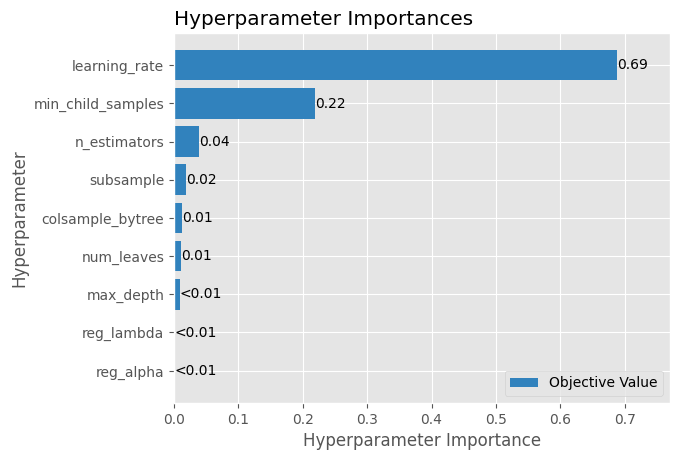

C:\Users\mukti\AppData\Local\Temp\ipykernel_36368\1838663870.py:77: ExperimentalWarning: optuna.visualization.matplotlib._optimization_history.plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  vis.plot_optimization_history(study)


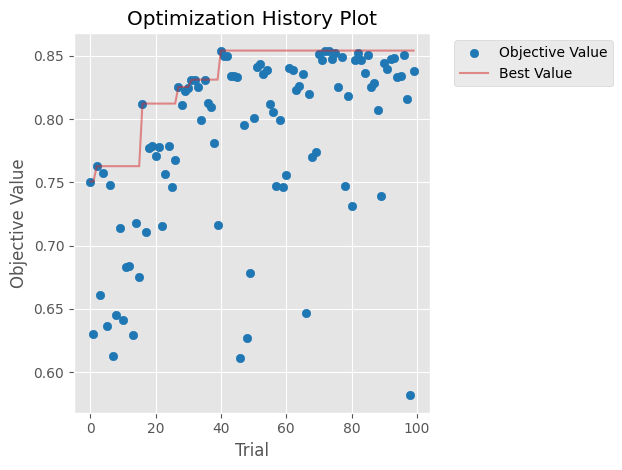

In [7]:
# Step 6: Optuna objective function for LightGBM

def objective_lightgbm(trial):
    # Hyperparameter space to explore
    n_estimators = trial.suggest_int('n_estimators', 100, 1000)
    learning_rate = trial.suggest_float('learning_rate', 1e-4, 1e-1, log=True)
    max_depth = trial.suggest_int('max_depth', 3, 15)
    num_leaves = trial.suggest_int('num_leaves', 20, 150)
    min_child_samples = trial.suggest_int('min_child_samples', 10, 100)
    colsample_bytree = trial.suggest_float('colsample_bytree', 0.5, 1.0)
    subsample = trial.suggest_float('subsample', 0.5, 1.0)
    reg_alpha = trial.suggest_float('reg_alpha', 1e-4, 10.0, log=True)  # L1 regularization
    reg_lambda = trial.suggest_float('reg_lambda', 1e-4, 10.0, log=True)  # L2 regularization

    # Log trial parameters
    params = {
        'n_estimators': n_estimators,
        'learning_rate': learning_rate,
        'max_depth': max_depth,
        'num_leaves': num_leaves,
        'min_child_samples': min_child_samples,
        'colsample_bytree': colsample_bytree,
        'subsample': subsample,
        'reg_alpha': reg_alpha,
        'reg_lambda': reg_lambda
    }
    
    
    # validation split INSIDE Optuna
    X_tr, X_val, y_tr, y_val = train_test_split(
        X_train_vec, y_train, test_size=0.2, random_state=42, stratify=y_train
    )

     # convert both splits to float32
    X_tr  = X_tr.astype(np.float32)
    X_val = X_val.astype(np.float32)

    # Create LightGBM model
    model = LGBMClassifier(**params,
                           random_state=42,
                           objective="multiclass",   
                           num_class=3 
      )
    # Train on X_tr and evaluate on X_val
    model.fit(X_tr, y_tr)
    y_val_pred = model.predict(X_val)
    val_acc = accuracy_score(y_val, y_val_pred)

    # FIXED: Log each trial in MLflow without retraining full data
    log_mlflow_trial("LightGBM", params, val_acc, trial.number)

    return val_acc

# Step 7: Run Optuna for LightGBM, log the best model, and plot the importance of each parameter
def run_optuna_experiment(n_trials=100):
    study = optuna.create_study(direction="maximize")
    study.optimize(objective_lightgbm, n_trials=n_trials)  # Increased to 100 trials

    # Get the best parameters
    best_params = study.best_params

    best_model = LGBMClassifier(**best_params,
                                random_state=42,
                                objective="multiclass",
                                num_class=3)
    
    best_model.fit(X_train_vec, y_train)
    
    # Log the best model with MLflow, passing the algo_name as "lightgbm"
    log_mlflow_best("LightGBM", best_model, X_train_vec, X_test_vec, y_train, y_test,best_params)

    #plot parameter importance
    vis.plot_param_importances(study)
    plt.show()

    #plot optimization history
    vis.plot_optimization_history(study)
    plt.show()

# Run the experiment for LightGBM
run_optuna_experiment()



